# Input Functions, esp. for [15O]Oxygen and Mintun1984 Models
## Setup

In [1]:
import os
import sys
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), os.pardir)))

In [2]:
# system functions that are always useful to have
import time
from pprint import pprint

# basic numeric setup
import numpy as np

from RadialArteryContext import RadialArteryContext
from BoxcarContext import BoxcarContext

%matplotlib inline

In [3]:
# define data & models; everything is decay corrected
kerndir = os.path.join(os.getenv("HOME"), "PycharmProjects", "dynesty", "idif2025", "data", "kernels")
petdir = os.path.join(os.getenv("HOME"), "PycharmProjects", "dynesty", "idif2025", "data", "ses-20210421150523", "pet")
petdir2 = os.path.join(os.getenv("HOME"), "PycharmProjects", "dynesty", "idif2025", "data", "ses-20210421154248", "pet")
idif = os.path.join(petdir, "sub-108293_ses-20210421150523_trc-oo_proc-MipIdif_idif.nii.gz")
idif2 = os.path.join(petdir2, "sub-108293_ses-20210421154248_trc-oo_proc-MipIdif_idif.nii.gz")
twil = os.path.join(petdir, "sub-108293_ses-20210421150523_trc-oo_proc-TwiliteKit-do-make-input-func-nomodel_inputfunc.nii.gz")
twil2 = os.path.join(petdir2, "sub-108293_ses-20210421154248_trc-oo_proc-TwiliteKit-do-make-input-func-nomodel_inputfunc.nii.gz")
kern = os.path.join(kerndir, "kernel_hct=46.8.nii.gz")

# For IDIF:  1st two Schaeffer parcels
pet = os.path.join(petdir, "sub-108293_ses-20210421150523_trc-oo_proc-delay0-BrainMoCo2-createNiftiMovingAvgFrames-ParcSchaeffer-reshape-to-schaeffer-2parcs.nii.gz")
# For IDIF:  only four Schaeffer parcels 
pet2 = os.path.join(petdir2, "sub-108293_ses-20210421154248_trc-oo_proc-delay0-BrainMoCo2-createNiftiMovingAvgFrames_timeAppend-4-ParcSchaeffer-reshape-to-schaeffer-select-4.nii.gz")


### Defining truths for Artery

```
    v[0] = u[0] * 30                # t_0
    v[1] = u[1] * 30                # \tau_2 ~ t_2 - t_0
    v[2] = u[2] * 20                # \alpha - 1
    v[3] = u[3] * 30 + 3            # 1/\beta
    v[4] = u[4] * 2.5 + 0.5         # p
    v[5] = u[5] * 3 - 3             # \delta p_2 ~ p_2 - p
    v[6] = u[6] * 3 - 3             # \delta p_3 ~ p_3 - p_2
    v[7] = u[7] * 5 * halflife      # 1/\gamma for s.s.
    v[8] = u[8] * 0.9               # f_2
    v[9] = u[9] * 0.9               # f_3
    v[10] = u[10] * 4 + 0.5         # A is amplitude adjustment
    v[11] = u[11] * sigma           # sigma ~ fraction of M0
```

In [4]:
truths_twil = [
    2.00406654e+01, 7.88819660e+00, 2.07974378e+00, 3.16720385e+00,
    2.88695319e+00, -1.52623465e+00, -1.93168152e+00, 3.31784777e+02,
    3.42119756e-01, 4.41024587e-02, 2.46783578e+00, 3.16438586e-02
]

truths_twil2 = [
    5.38261677e+00, 1.15458173e+01, 1.45832418e+00, 1.06875200e+01,
    2.74777845e+00, -2.06888471e-01, -2.50177808e+00, 4.01832294e+02,
    3.66103282e-01, 6.98442323e-02, 2.51614966e+00, 3.08620083e-02
]

truths_idif = [
    1.01293025e+01, 2.31190493e+01, 7.20254985e-01, 8.23339178e+00,
    1.63190727e+00, -1.27520655e+00, -1.31983418e+00, 2.87175601e+02,
    8.61735620e-02, 6.47357411e-02, 2.85407213e+00, 3.37051662e-02
]

truths_idif2 = [
    4.05371709e+00, 8.48827339e+00, 1.43439169e+00, 4.78458747e+00,
    2.52871627e+00, -7.56126700e-01, -1.99849086e+00, 3.11584037e+02,
    5.82235098e-01, 6.90884686e-02, 2.38205756e+00, 5.09048188e-02
]

# Inspect RadialArtery

In [5]:
dd = {
    "input_func_fqfn": twil,
    "kernel_fqfn": kern,
    "tag": "playground_ra",
    "nlive": 3000
}
ra = RadialArteryContext(dd)

dd2 = {
    "input_func_fqfn": twil2,
    "kernel_fqfn": kern,
    "tag": "playground_ra2",
    "nlive": 3000
}
ra2 = RadialArteryContext(dd2)


### Plot RadialArtery ra

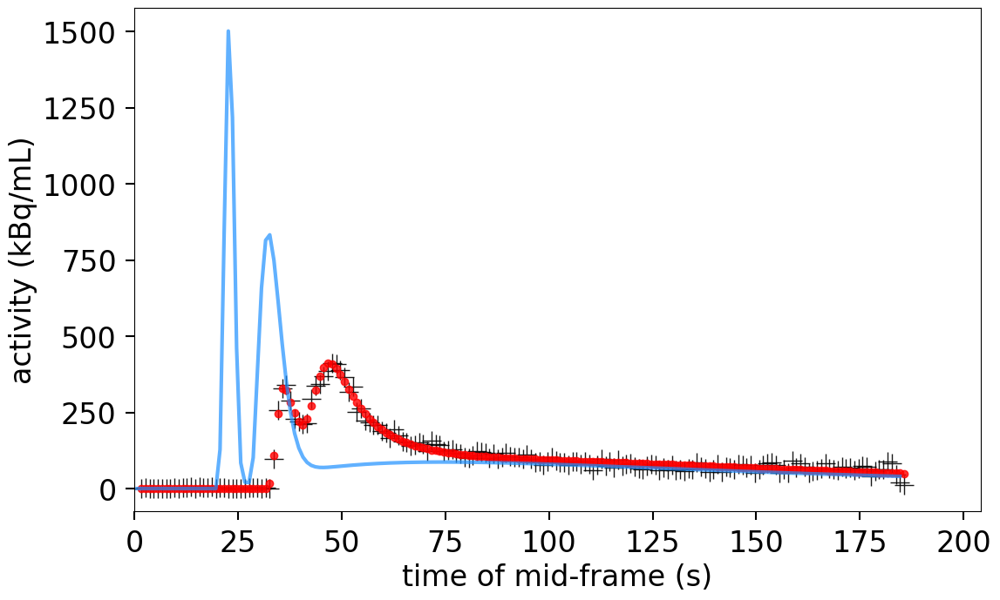

In [6]:
ra.plotting.truths_plot(truths_twil)

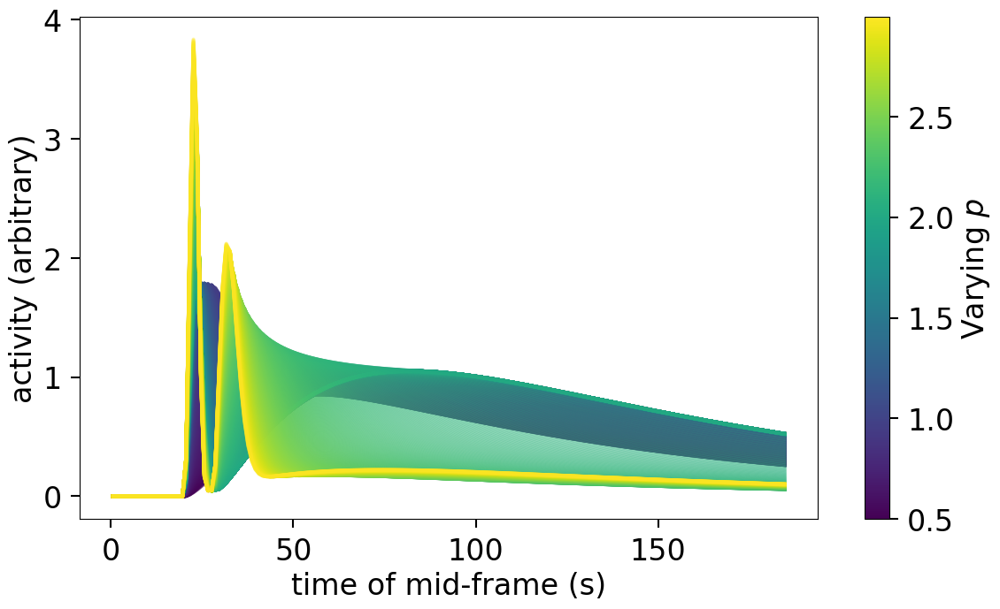

In [7]:
ra.plotting.variations_plot(
    truths_twil, 
    tindex=4, tmin=0.5, tmax=3, 
    ncolors=1000, alpha=0.3, linewidth=3, 
    do_save=False)

### Let's sample from this distribution of ra using the default `dynesty` settings with `'slice'`.

Previously, 4bolus model with t^(alpha - 1) gave:  
    # iter: 23900 | batch: 6 | bound: 22 | nc: 1 | ncall: 2130740 | eff(%):  1.107 |   
    # loglstar: 385.219 < 396.293 < 393.275 | logz: 347.713 +/-  0.256 | stop:  0.912  

138356it [09:03, 254.75it/s, batch: 0 | bound: 122 | nc: 1 | ncall: 10612395 | eff(%):  1.304 | loglstar:   -inf < 381.250 <    inf | logz: 340.745 +/-  0.110 | dlogz:  0.000 >  0.010]  


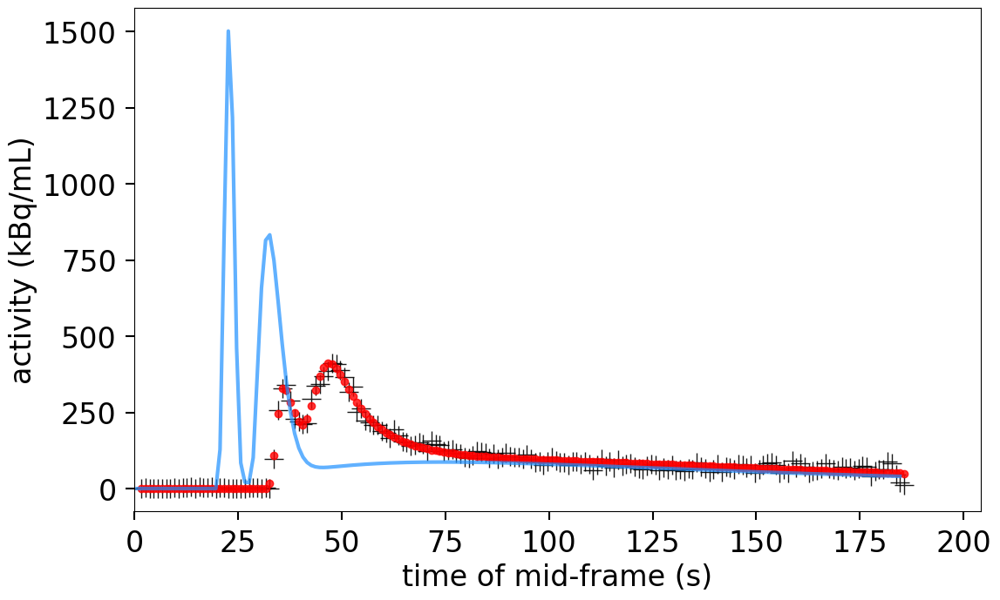

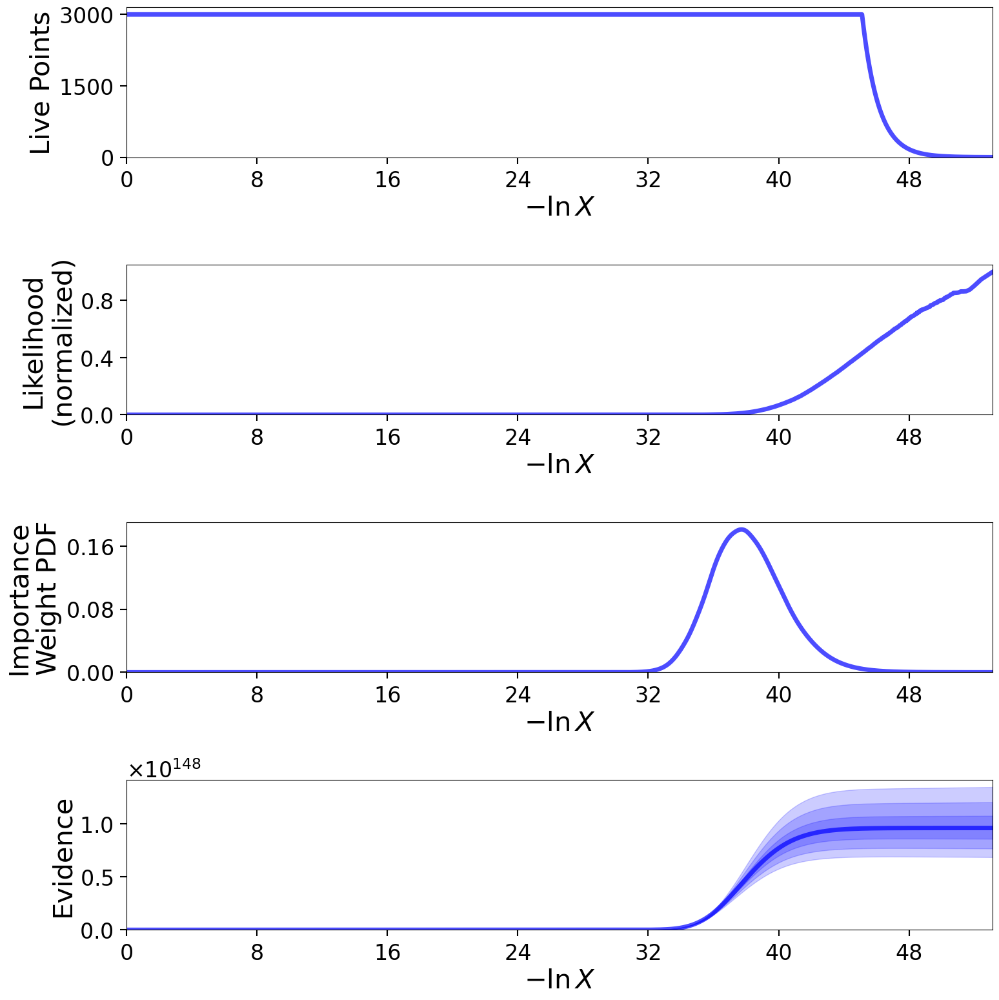

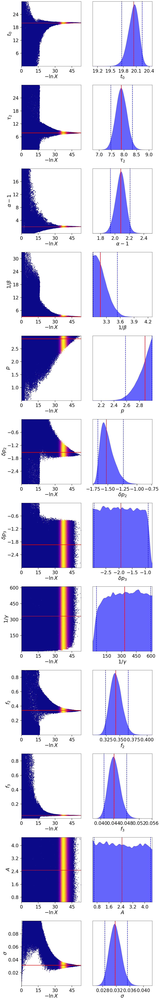

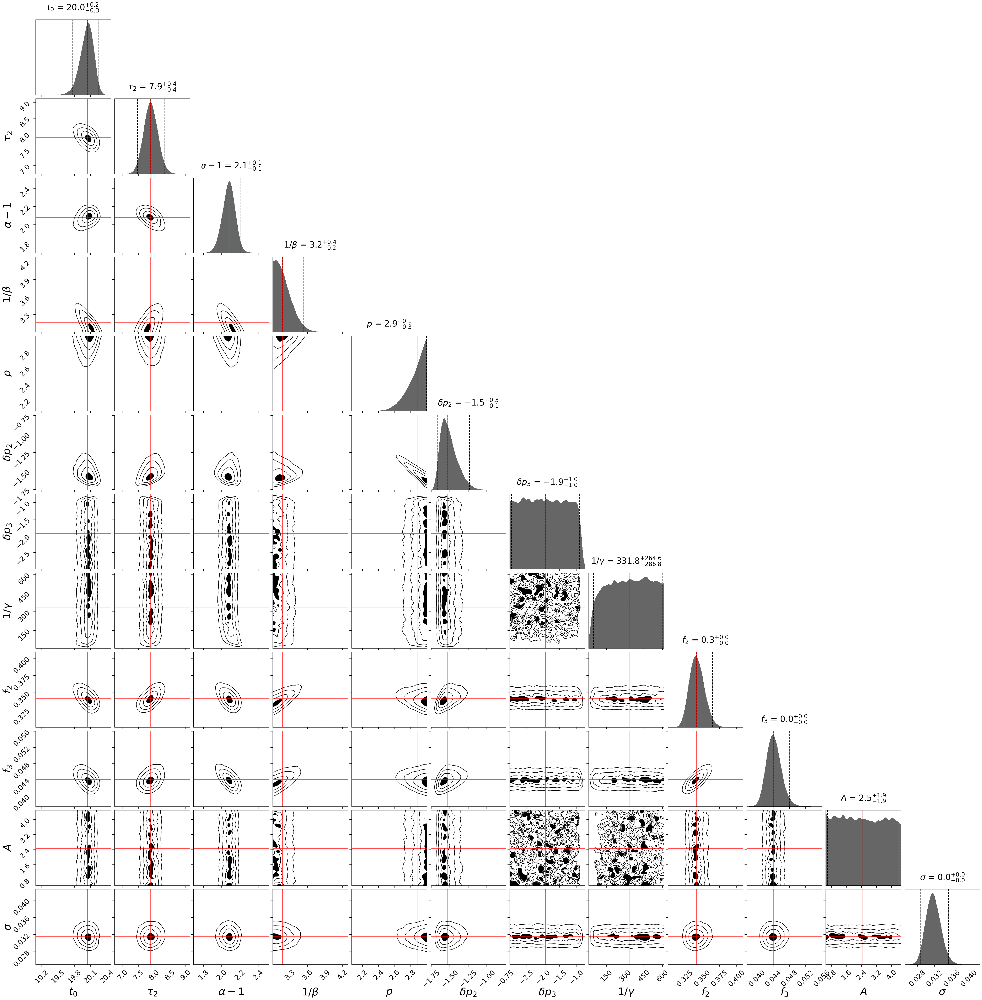

In [8]:
results_ra = ra.solver.run_nested(print_progress=True)
ra.plotting.results_plot()

### Plot RadialArtery ra2

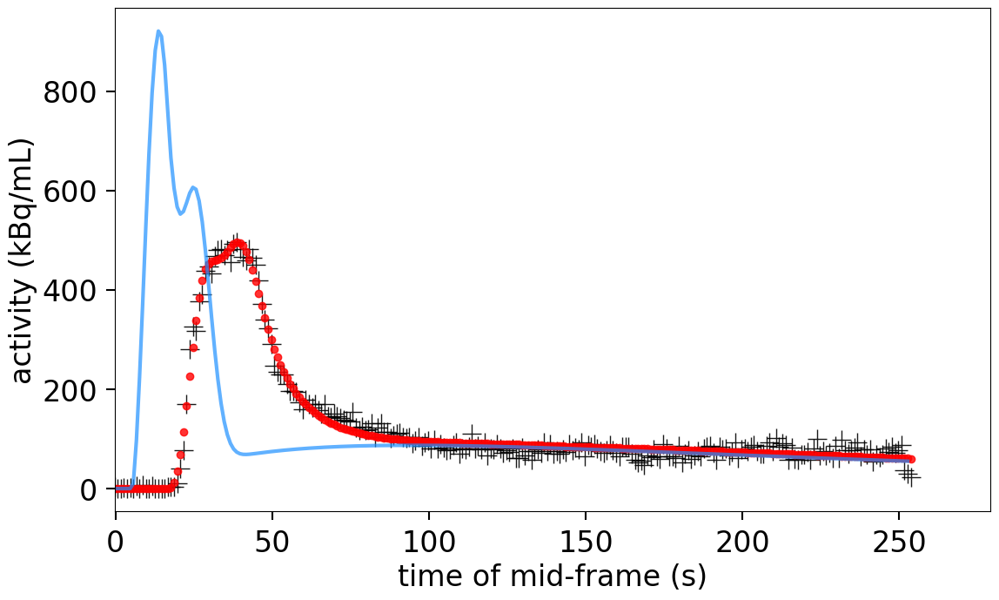

In [9]:
ra2.plotting.truths_plot(truths_twil2)

### Let's sample from this distribution of ra2 using the default `dynesty` settings with `'slice'`.

Previously, 4bolus model with t^(alpha - 1) gave:  
    # iter: 21353 | batch: 6 | bound: 18 | nc: 1 | ncall: 1934903 | eff(%):  1.088 |   
    # loglstar: 566.177 < 576.756 < 573.520 | logz: 535.749 +/-  0.234 | stop:  0.968  

126488it [10:22, 203.04it/s, batch: 0 | bound: 108 | nc: 1 | ncall: 9677848 | eff(%):  1.307 | loglstar:   -inf < 532.587 <    inf | logz: 496.036 +/-  0.103 | dlogz:  0.000 >  0.010]    


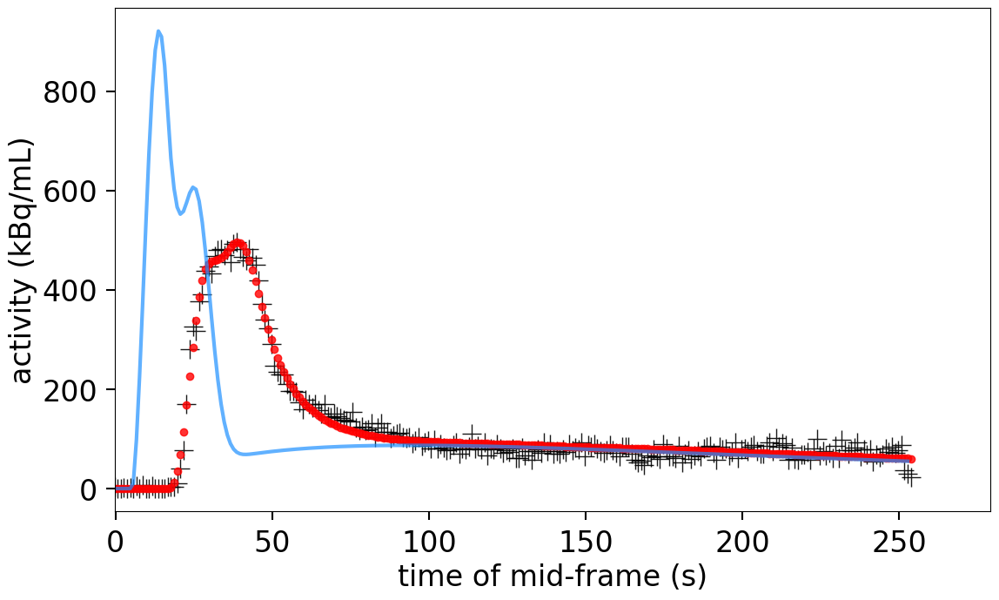

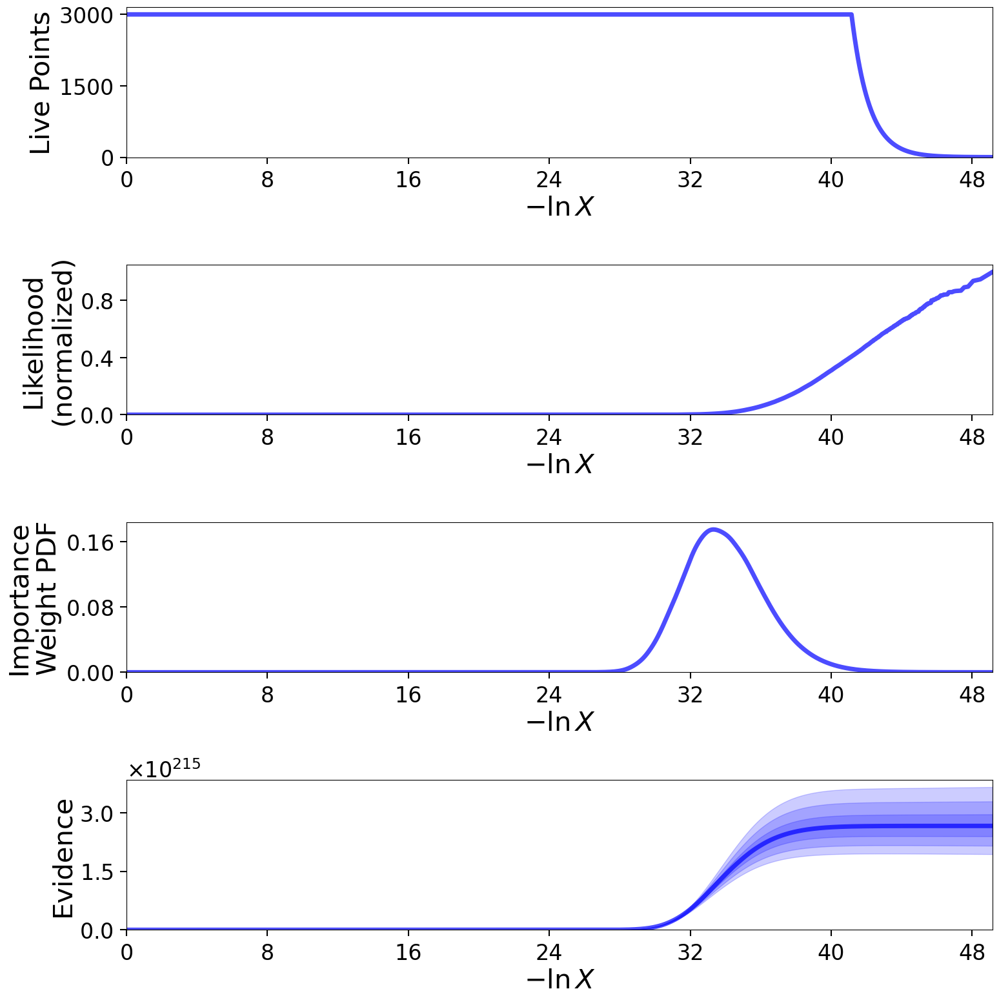

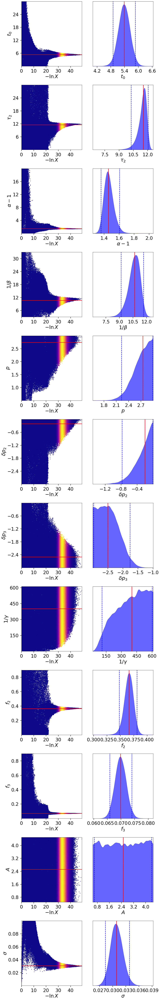

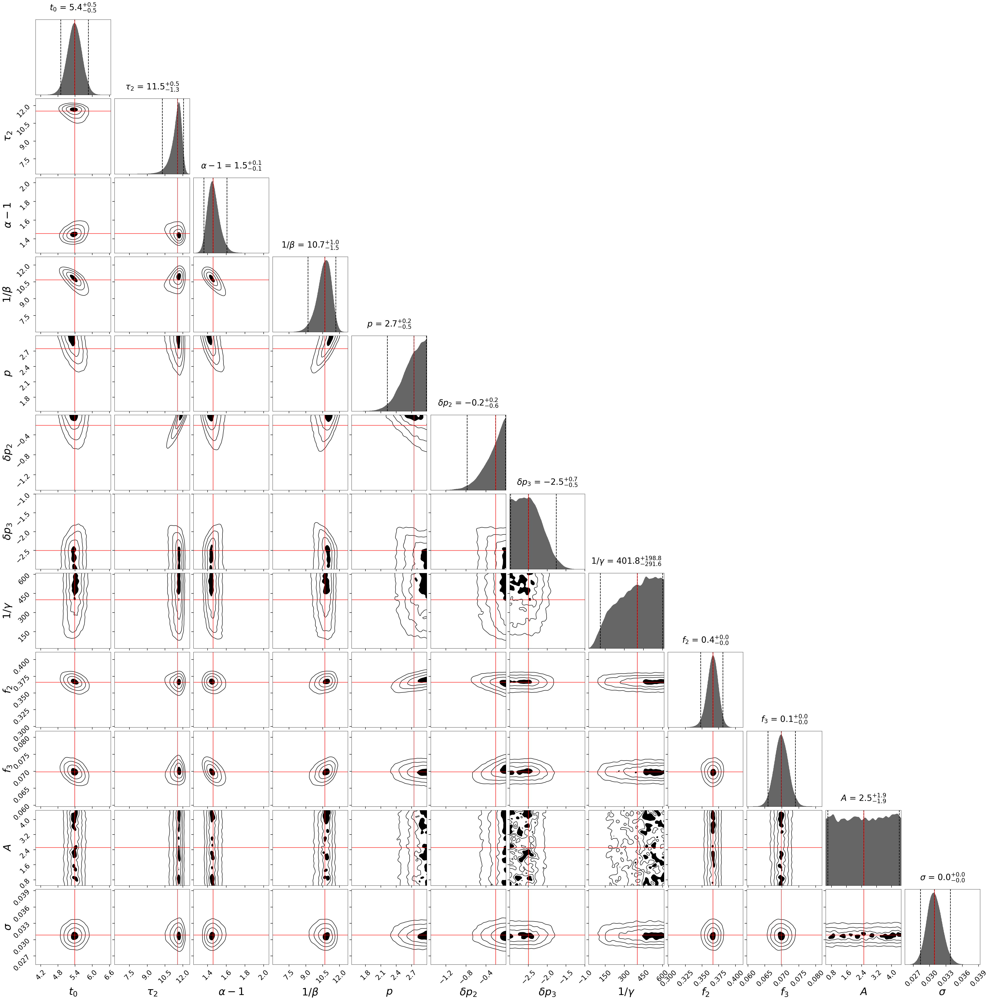

In [10]:
results_ra2  = ra2.solver.run_nested(print_progress=True)
ra2.plotting.results_plot()


# Inspect Boxcar

In [11]:
dd = {
    "input_func_fqfn": idif,
    "tag": "playground_bc",
    "nlive": 3000
}
bc = BoxcarContext(dd)

dd2 = {
    "input_func_fqfn": idif2,
    "tag": "playground_bc2",
    "nlive": 3000
}
bc2 = BoxcarContext(dd2)


### Plot Boxcar bc

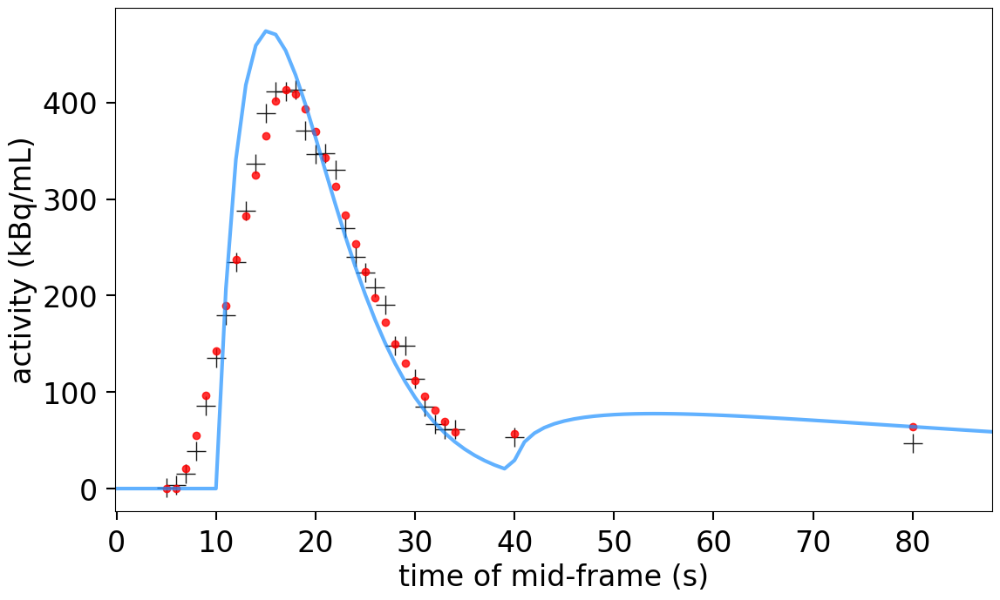

In [12]:
bc.plotting.truths_plot(truths_idif)

### Let's sample from this distribution of bc using the default `dynesty` settings with `'slice'`.

Previously, 4bolus model with t^(alpha - 1) gave:  
    # iter: 23900 | batch: 6 | bound: 22 | nc: 1 | ncall: 2130740 | eff(%):  1.107 |   
    # loglstar: 385.219 < 396.293 < 393.275 | logz: 347.713 +/-  0.256 | stop:  0.912  

91513it [01:36, 950.95it/s, batch: 0 | bound: 85 | nc: 1 | ncall: 7447783 | eff(%):  1.229 | loglstar:   -inf < 70.185 <    inf | logz: 45.289 +/-  0.079 | dlogz:  0.000 >  0.010]      


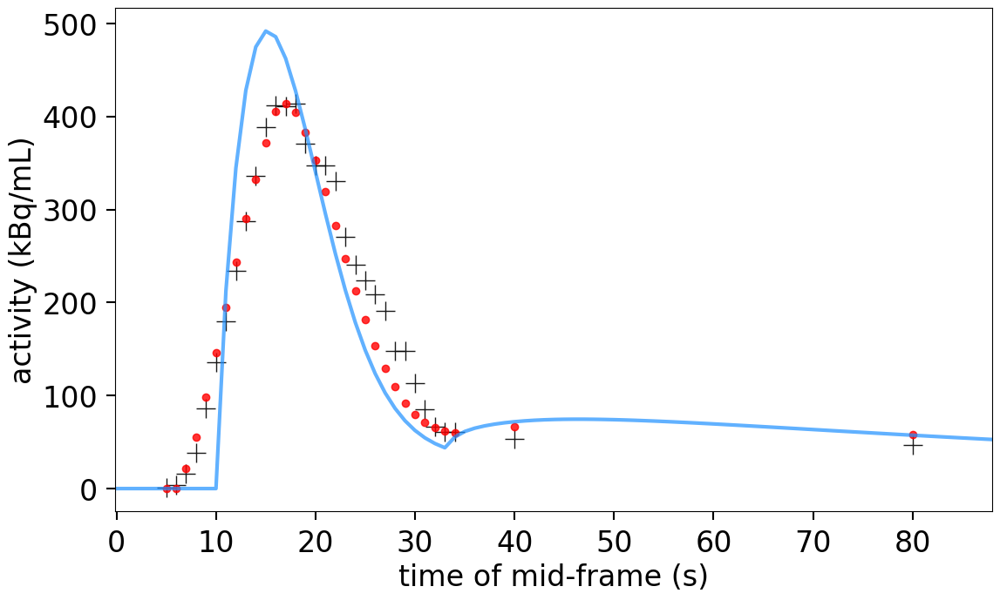

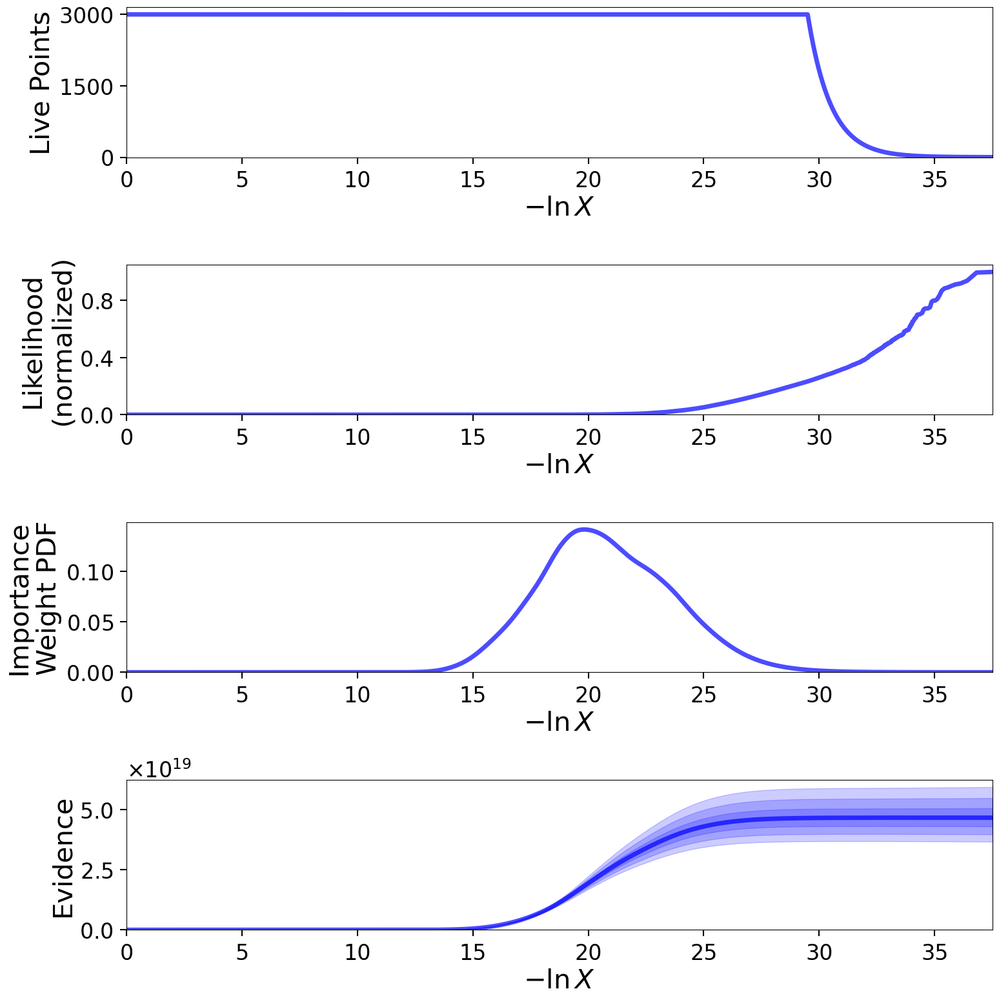

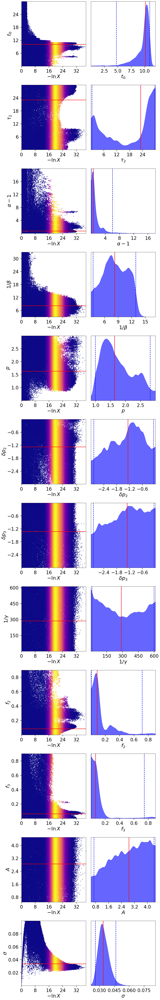

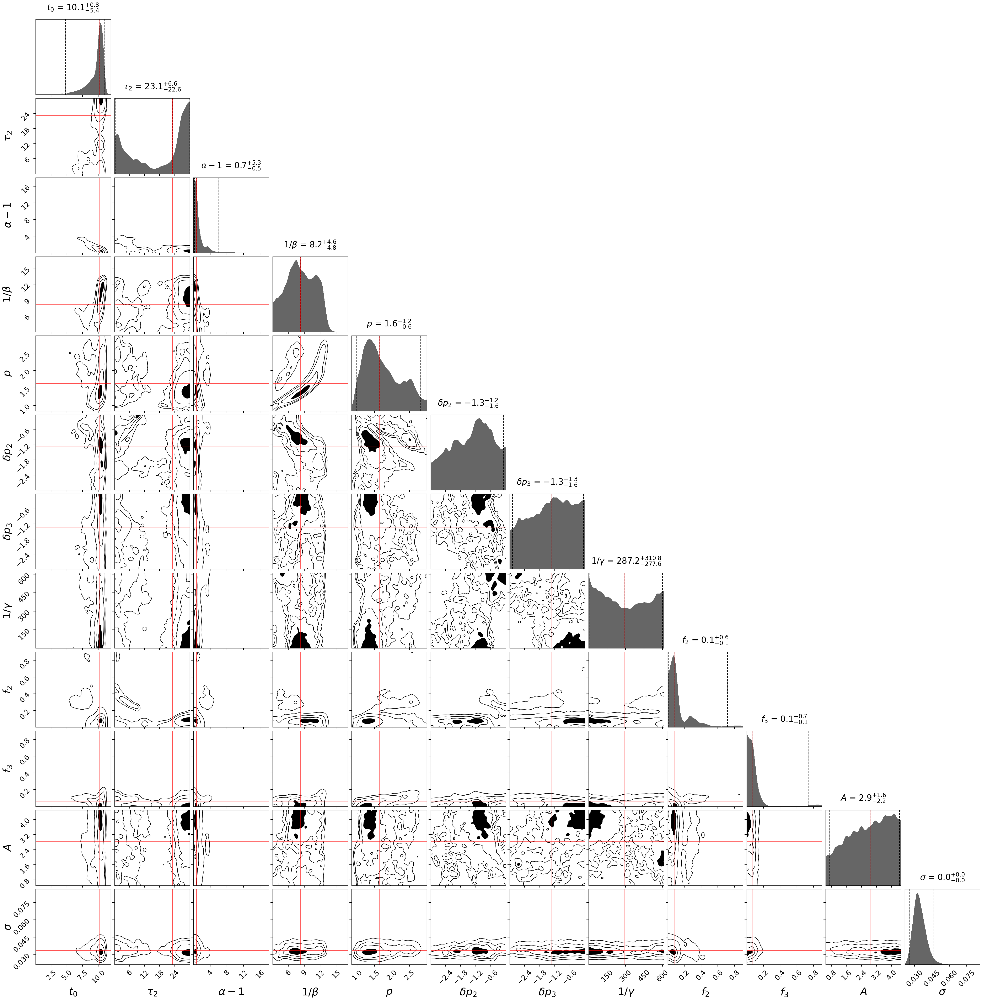

In [13]:
results_bc = bc.solver.run_nested(print_progress=True)
bc.plotting.results_plot()

### Plot Boxcar bc2

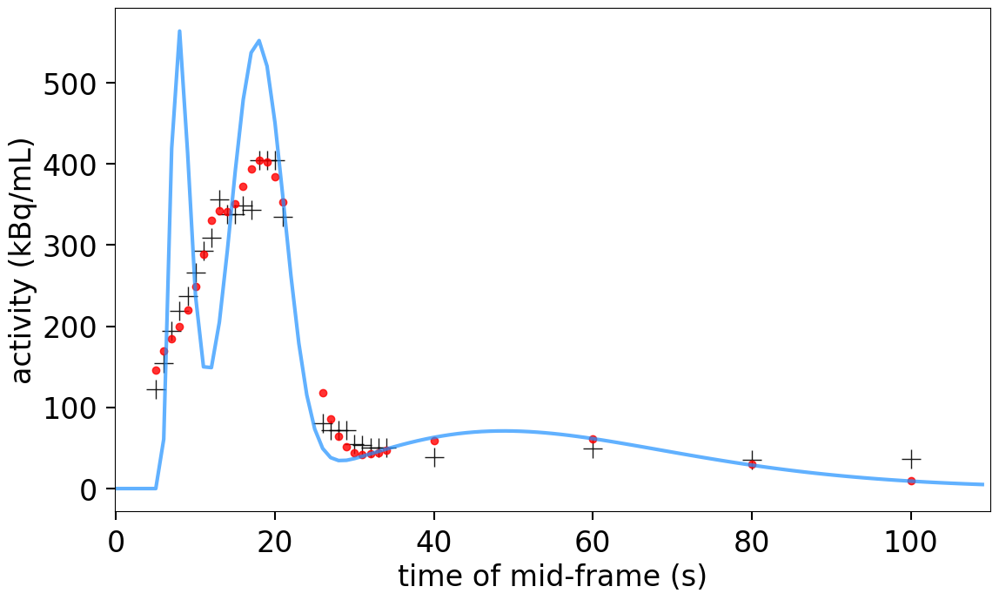

In [14]:
bc2.plotting.truths_plot(truths_idif2)

### Let's sample from this distribution of bc2 using the default `dynesty` settings with `'slice'`.

Previously, 4bolus model with t^(alpha - 1) gave:  
    # iter: 21353 | batch: 6 | bound: 18 | nc: 1 | ncall: 1934903 | eff(%):  1.088 |   
    # loglstar: 566.177 < 576.756 < 573.520 | logz: 535.749 +/-  0.234 | stop:  0.968  

97082it [01:44, 929.27it/s, batch: 0 | bound: 84 | nc: 1 | ncall: 7387282 | eff(%):  1.314 | loglstar:   -inf < 53.037 <    inf | logz: 26.287 +/-  0.084 | dlogz:  0.000 >  0.010]      


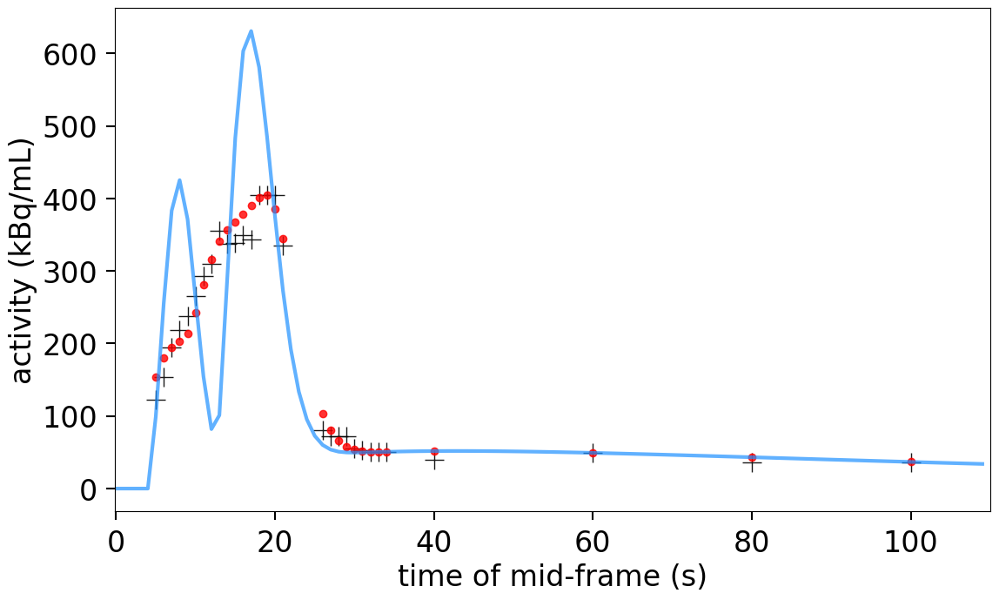

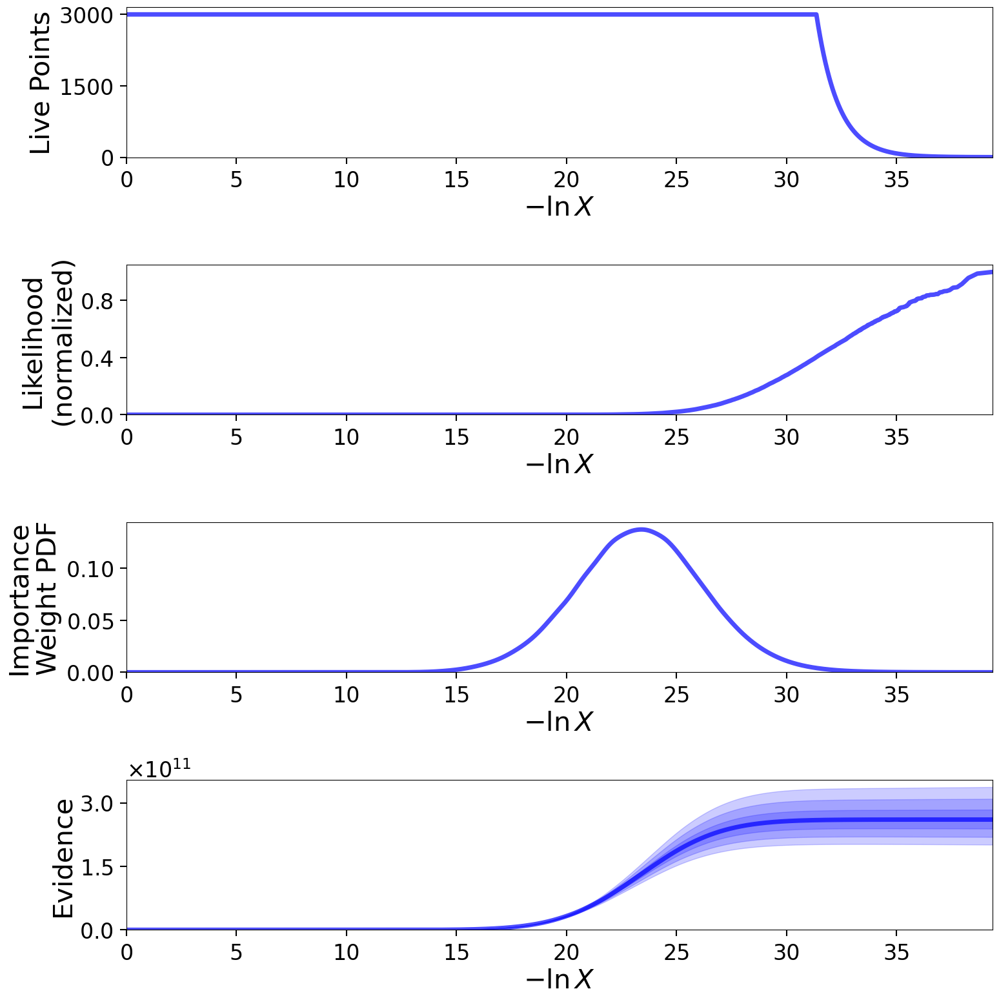

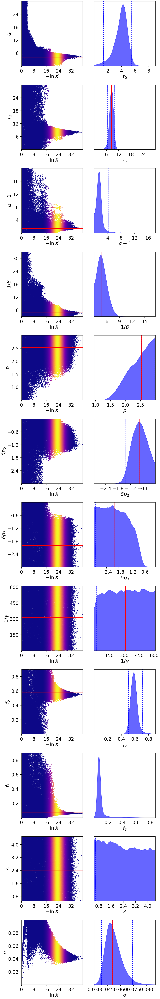

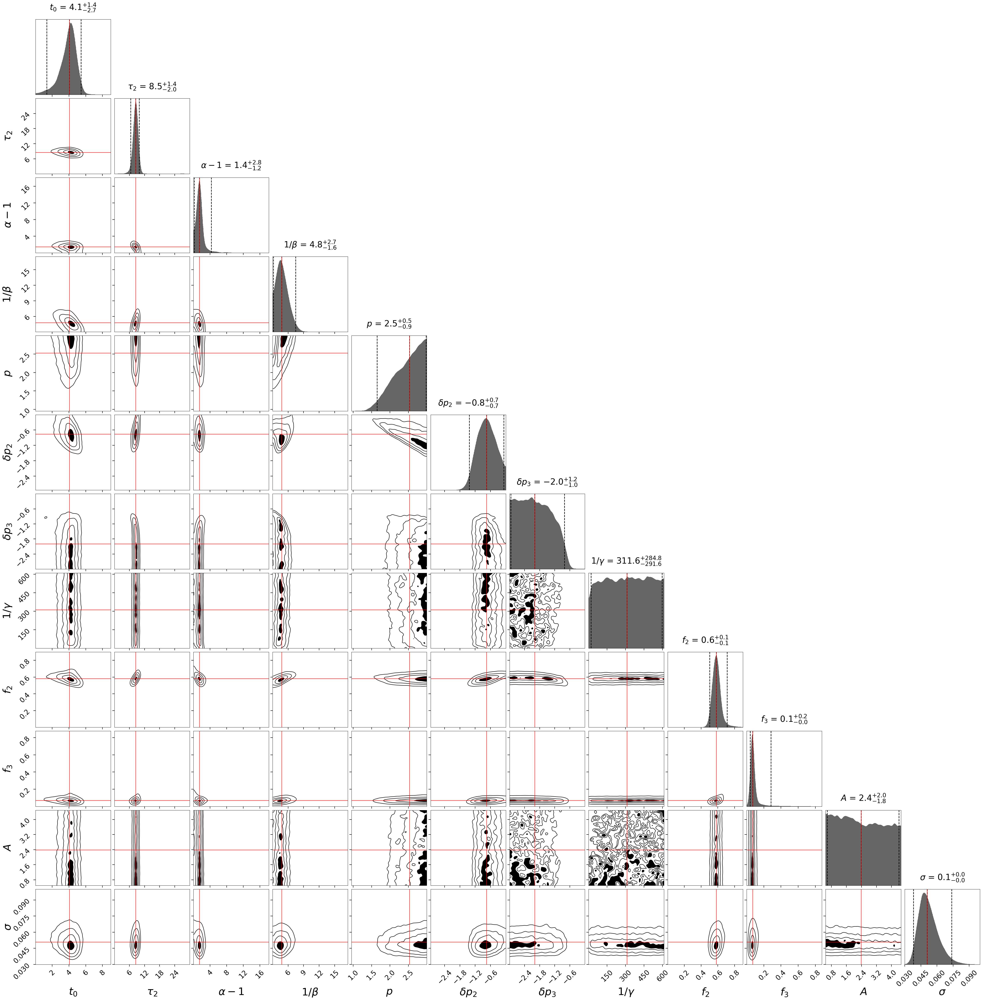

In [15]:
results_bc2  = bc2.solver.run_nested(print_progress=True)
bc2.plotting.results_plot()


In [16]:
pprint(ra.solver.truths)
pprint(ra2.solver.truths)
pprint(bc.solver.truths)
pprint(bc2.solver.truths)


array([ 2.00406654e+01,  7.88819660e+00,  2.07974378e+00,  3.16720385e+00,
        2.88695319e+00, -1.52623465e+00, -1.93168152e+00,  3.31784777e+02,
        3.42119756e-01,  4.41024587e-02,  2.46783578e+00,  3.16438586e-02])
array([ 5.38261677e+00,  1.15458173e+01,  1.45832418e+00,  1.06875200e+01,
        2.74777845e+00, -2.06888471e-01, -2.50177808e+00,  4.01832294e+02,
        3.66103282e-01,  6.98442323e-02,  2.51614966e+00,  3.08620083e-02])
array([ 1.01293025e+01,  2.31190493e+01,  7.20254985e-01,  8.23339178e+00,
        1.63190727e+00, -1.27520655e+00, -1.31983418e+00,  2.87175601e+02,
        8.61735620e-02,  6.47357411e-02,  2.85407213e+00,  3.37051662e-02])
array([ 4.05371709e+00,  8.48827339e+00,  1.43439169e+00,  4.78458747e+00,
        2.52871627e+00, -7.56126700e-01, -1.99849086e+00,  3.11584037e+02,
        5.82235098e-01,  6.90884686e-02,  2.38205756e+00,  5.09048188e-02])
